In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import pairwise_distances
import seaborn as sns

In [2]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams['figure.dpi'] = 300

In [3]:
import copy

from load_data import load_expression
from scipy.stats import pearsonr

from model import SpiceMix
from Result import SpiceMixResult
from util import moran_i_statistic

In [4]:
from IPython.core.display import HTML
HTML("""
<style>
.output_png {
    display: flex;
    justify-content: center;
}
</style>
""")

In [5]:
import h5py

In [ ]:
with h5py.File("../../data/spatialLIBD/results_with_spatial_low_lambda_four_fovs.hdf5", 'r') as h5file:
    new_genes = h5file["dataset"]["gene_sets"]["151673"][()]
    
with h5py.File("../../data/spatialLIBD/results_with_spatial_lowest_lambda_four_fovs.hdf5", 'a') as h5file:
    h5file["dataset"]["gene_sets"]["151673"][...] = new_genes
    print(len(h5file["dataset"]["gene_sets"]["151673"][()]))

In [8]:
# Previous runs
STARmap_spatial_result = SpiceMixResult(
    path2dataset='../../data/spatialLIBD',
    result_filename="../../data/spatialLIBD/results_with_spatial_lowest_lambda_four_fovs.hdf5",
    neighbor_suffix="",
)

Result file = ../../data/spatialLIBD/results_with_spatial_lowest_lambda_four_fovs.hdf5


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/util.py:116: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  ans[key] = item.value


['HES4' 'ISG15' 'SDF4' ... 'ND6' 'CYTB' 'LOC102724770']
['H E S 4', 'I S G 1 5', 'S D F 4', 'A C A P 3', 'D V L 1', 'A U R K A I P 1', 'C C N L 2', 'M R P L 2 0', 'S S U 7 2', 'G N B 1', 'G A B R D', 'P R K C Z', 'F A A P 2 0', 'R E R 1', 'P R X L 2 B', 'T P R G 1 L', 'L R R C 4 7', 'K C N A B 2', 'C H D 5', 'R P L 2 2', 'A C O T 7', 'C A M T A 1', 'P A R K 7', 'R E R E', 'E N O 1', 'C L S T N 1', 'K I F 1 B', 'T A R D B P', 'S R M', 'F B X O 2', 'F B X O 4 4', 'M F N 2', 'P R D M 2', 'E F H D 2', 'P L E K H M 2', 'A T P 1 3 A 2', 'S D H B', 'I G S F 2 1', 'C A P Z B', 'M I C O S 1 0', 'N B L 1', 'C A M K 2 N 1', 'P I N K 1', 'H P 1 B P 3', 'E I F 4 G 3', 'R A P 1 G A P', 'C D C 4 2', 'H N R N P R', 'R P L 1 1', 'P I T H D 1', 'T M E M 5 0 A', 'M T F R 1 L', 'S T M N 1', 'Z N F 5 9 3', 'S H 3 B G R L 3', 'H M G N 2', 'N U D C', 'T R N P 1', 'T M E M 2 2 2', 'I F I 6', 'S T X 1 2', 'D N A J C 8', 'A T P 5 I F 1', 'S D C 3', 'P U M 1', 'Z C C H C 1 7', 'F A B P 3', 'P E F 1', 'A D G R B 

In [9]:
STARmap_nmf_result = SpiceMixResult(
    path2dataset='../../data/spatialLIBD',
    result_filename="../../data/spatialLIBD/results_no_spatial_four_fovs.hdf5",
    neighbor_suffix="",
)

Result file = ../../data/spatialLIBD/results_no_spatial_four_fovs.hdf5
['HES4' 'ISG15' 'SDF4' ... 'ND6' 'CYTB' 'LOC102724770']
['H E S 4', 'I S G 1 5', 'S D F 4', 'A C A P 3', 'D V L 1', 'A U R K A I P 1', 'C C N L 2', 'M R P L 2 0', 'S S U 7 2', 'G N B 1', 'G A B R D', 'P R K C Z', 'F A A P 2 0', 'R E R 1', 'P R X L 2 B', 'T P R G 1 L', 'L R R C 4 7', 'K C N A B 2', 'C H D 5', 'R P L 2 2', 'A C O T 7', 'C A M T A 1', 'P A R K 7', 'R E R E', 'E N O 1', 'C L S T N 1', 'K I F 1 B', 'T A R D B P', 'S R M', 'F B X O 2', 'F B X O 4 4', 'M F N 2', 'P R D M 2', 'E F H D 2', 'P L E K H M 2', 'A T P 1 3 A 2', 'S D H B', 'I G S F 2 1', 'C A P Z B', 'M I C O S 1 0', 'N B L 1', 'C A M K 2 N 1', 'P I N K 1', 'H P 1 B P 3', 'E I F 4 G 3', 'R A P 1 G A P', 'C D C 4 2', 'H N R N P R', 'R P L 1 1', 'P I T H D 1', 'T M E M 5 0 A', 'M T F R 1 L', 'S T M N 1', 'Z N F 5 9 3', 'S H 3 B G R L 3', 'H M G N 2', 'N U D C', 'T R N P 1', 'T M E M 2 2 2', 'I F I 6', 'S T X 1 2', 'D N A J C 8', 'A T P 5 I F 1', 'S 

Found 147 iterations from ../../data/spatialLIBD/results_with_spatial_lowest_lambda_four_fovs.hdf5


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/util.py:116: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  ans[key] = item.value


Found 318 iterations from ../../data/spatialLIBD/results_no_spatial_four_fovs.hdf5


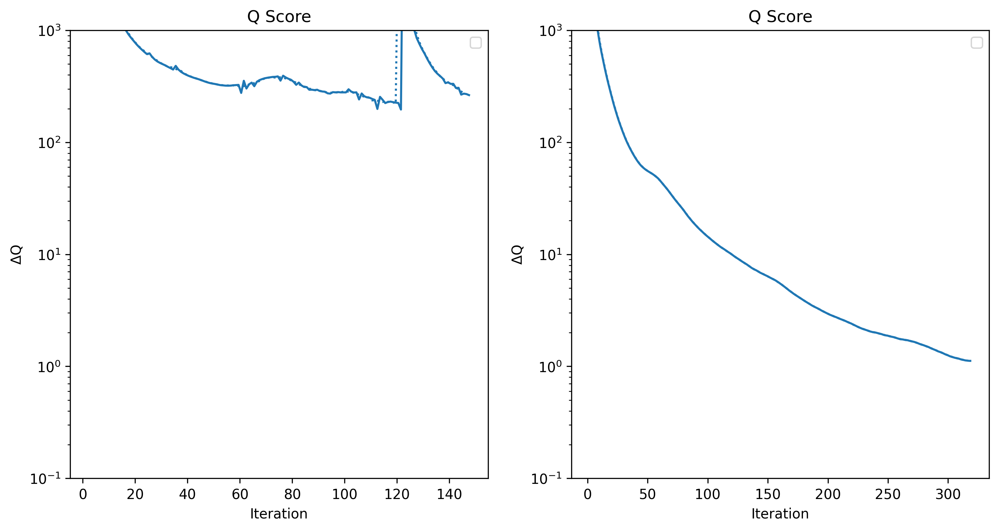

In [7]:
# Prior to downstream analysis, we should make sure the models have converged
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
STARmap_spatial_result.plot_convergence(axes[0], label='SpiceMix', c='C0')
STARmap_nmf_result.plot_convergence(axes[1], label='NMF', c='C0')

In [8]:
# Load latent states for all cells estimated by the last iteration of SpiceMix/NMF
STARmap_spatial_result.load_latent_states(iiter=-1)
STARmap_nmf_result.load_latent_states(iiter=-1)

Iteration -1


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/util.py:116: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  ans[key] = item.value


Iteration -1


In [9]:
# Setting it up for BayesSpace
matching_index = (STARmap_spatial_result.data["replicate"] == "151673")
spot_subset = STARmap_spatial_result.data[matching_index]
subset_weights = spot_subset[STARmap_spatial_result.weight_columns]
subset_weights.to_csv("spicemix_spatialLIBD_weights.csv", header=False, index=False)

In [10]:
STARmap_spatial_result.determine_clusters(7)
STARmap_nmf_result.determine_clusters(7)

array([3, 1, 6, ..., 2, 2, 1])

In [11]:
print(STARmap_spatial_result.calculate_ari_score())
print(STARmap_nmf_result.calculate_ari_score())

0.27216537522077555
0.227618357762733


In [12]:
STARmap_spatial_result.determine_clusters(7, replicate="151673")
STARmap_nmf_result.determine_clusters(7, replicate="151673")

array([4, 3, 5, ..., 3, 5, 4])

In [13]:
print(STARmap_spatial_result.calculate_ari_score(replicate="151673"))
print(STARmap_nmf_result.calculate_ari_score(replicate="151673"))

0.34448113243682493
0.2512710175860696


## Refining clusters with smoothing

In [16]:
def refine(sample_ids, clustering, dis, shape="hexagon"):
    refined_pred=[]
    pred = pd.DataFrame({"pred": clustering}, index=sample_ids)
    dis_df = pd.DataFrame(dis, index=sample_ids, columns=sample_ids)
    
    if shape=="hexagon":
        num_nbs=6 
    elif shape=="square":
        num_nbs=4
    else:
        print("Shape not recognized")
        
    for index in sample_ids:
        dis_tmp=dis_df.loc[index, :].sort_values()
        nbs=dis_tmp[0:num_nbs+1]
        nbs_pred=pred.loc[nbs.index, "pred"]
        self_pred=pred.loc[index, "pred"]
        v_c=nbs_pred.value_counts()
        if (v_c.loc[self_pred] < num_nbs/2) and (np.max(v_c) >num_nbs/2):
            refined_pred.append(v_c.idxmax())
        else:           
            refined_pred.append(self_pred)
            
    return refined_pred

In [17]:
matching_index = (STARmap_spatial_result.data["replicate"] == "151673")
spot_subset = STARmap_spatial_result.data[matching_index]
coordinates = spot_subset[["x", "y"]].values
distance_matrix = pairwise_distances(coordinates)
refined_clustering = refine(spot_subset.index, spot_subset["cluster"], distance_matrix)
STARmap_spatial_result.data.loc[matching_index, "cluster"] = refined_clustering

In [ ]:
print(STARmap_spatial_result.calculate_ari_score(replicate="151673"))
print(STARmap_nmf_result.calculate_ari_score(replicate="151673"))

## In-situ cluster plots

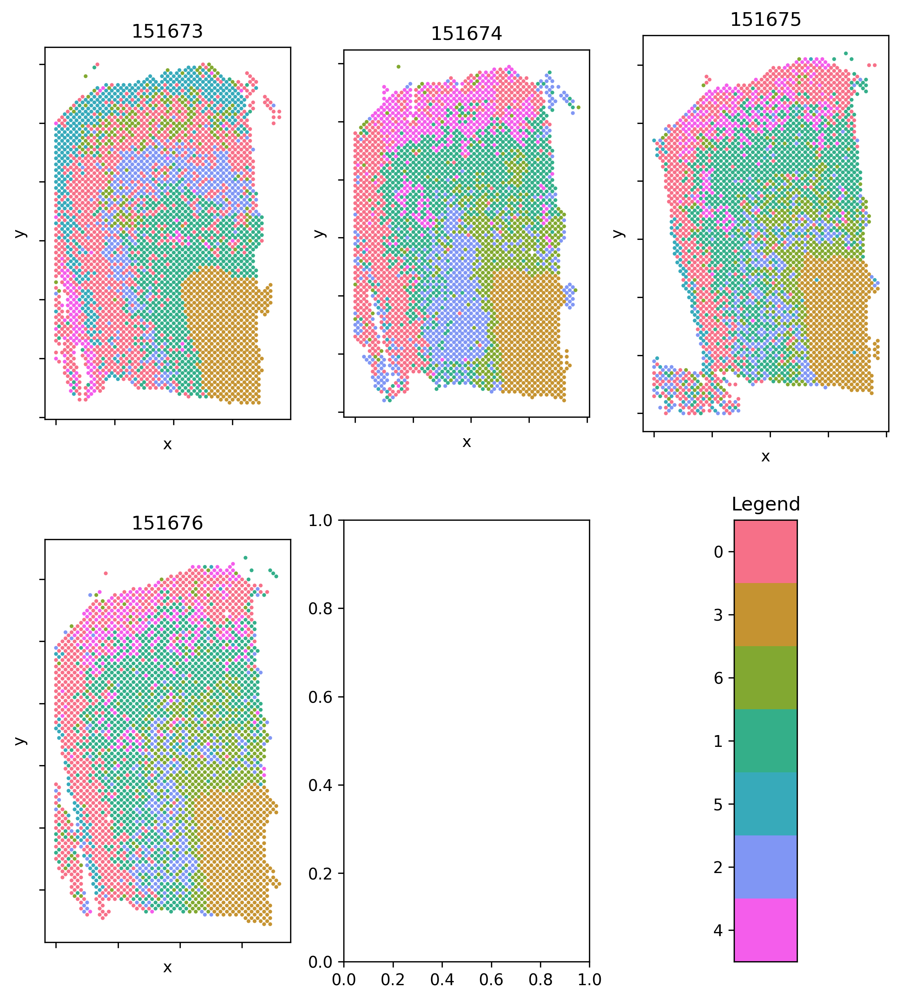

In [14]:
plot_height = int(np.sqrt(STARmap_spatial_result.num_repli))
plot_width = STARmap_spatial_result.num_repli // plot_height

if plot_height * plot_width < STARmap_spatial_result.num_repli + 1:
    plot_width += 1

fig, axes = plt.subplots(plot_height, plot_width, figsize=(plot_height * 4, plot_width * 3), squeeze=False)
STARmap_spatial_result.plot_multireplicate(axes, "cluster", s=2)

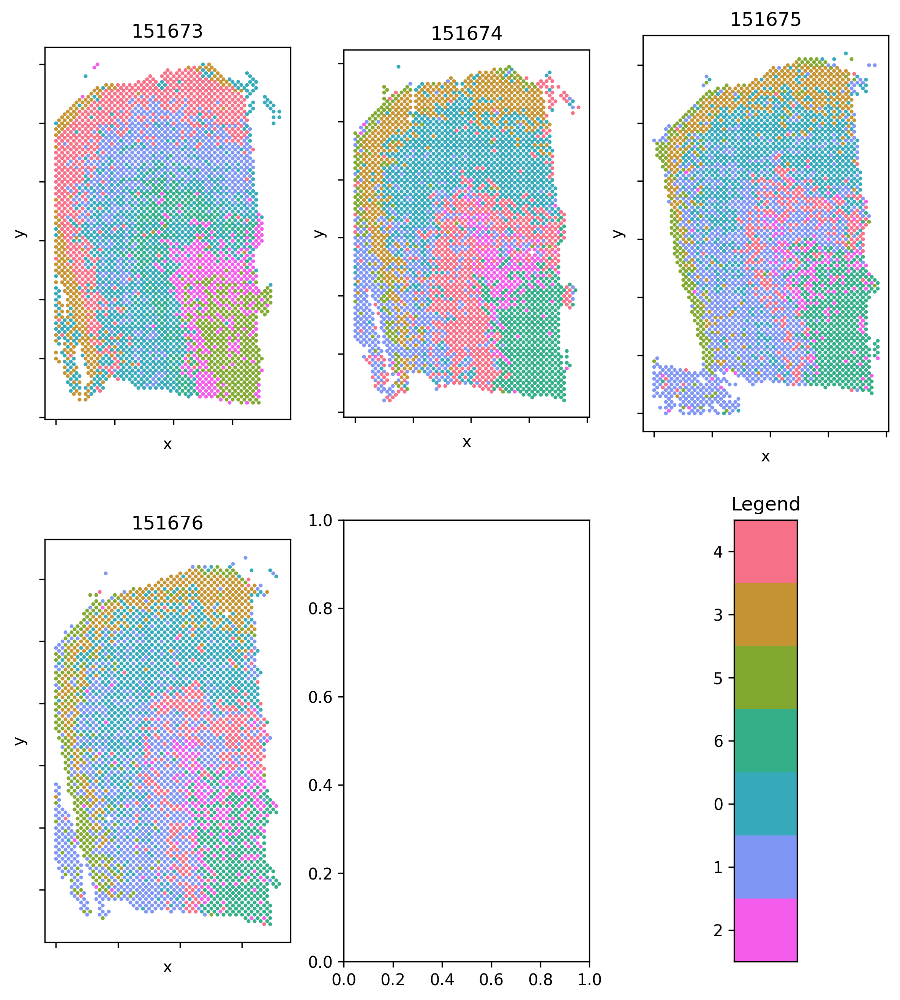

In [15]:
plot_height = int(np.sqrt(STARmap_nmf_result.num_repli))
plot_width = STARmap_nmf_result.num_repli // plot_height

if plot_height * plot_width < STARmap_nmf_result.num_repli + 1:
    plot_width += 1

fig, axes = plt.subplots(plot_height, plot_width, figsize=(plot_height * 4, plot_width * 3), squeeze=False)
STARmap_nmf_result.plot_multireplicate(axes, "cluster", s=2)

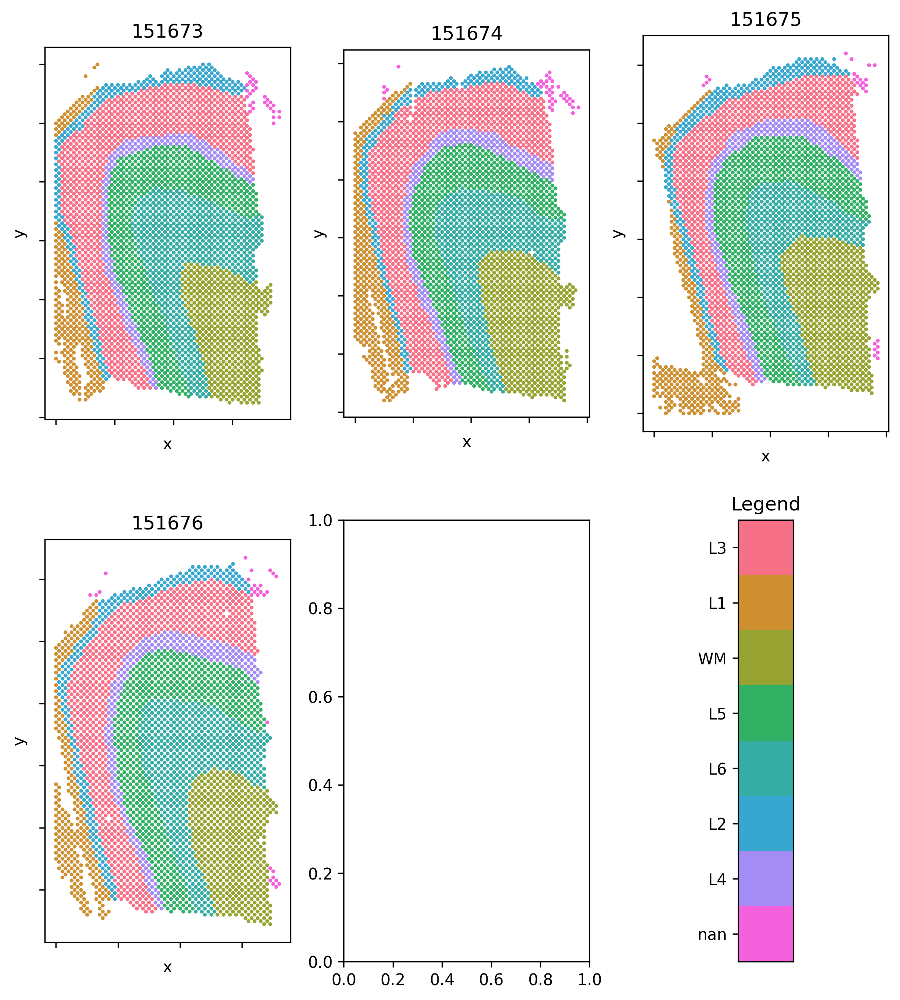

In [16]:
plot_height = int(np.sqrt(STARmap_nmf_result.num_repli))
plot_width = STARmap_nmf_result.num_repli // plot_height

if plot_height * plot_width < STARmap_nmf_result.num_repli + 1:
    plot_width += 1

fig, axes = plt.subplots(plot_height, plot_width, figsize=(plot_height * 4, plot_width * 3), squeeze=False)
STARmap_nmf_result.plot_multireplicate(axes, "label", s=2)

In [17]:
replicate = 0

In [ ]:
plot_height = 10
plot_width = 7
fig, axes = plt.subplots(plot_height, plot_width, figsize=(plot_width * 3, plot_height * 3))
fig.suptitle('In situ expression of metagenes - SpiceMix (top) vs NMF (bottom)', y=.92)
STARmap_spatial_result.plot_metagenes(axes[[0, 2, 4, 6, 8]], replicate=replicate, s=0.8)
STARmap_nmf_result.plot_metagenes(axes[[1, 3, 5, 7, 9]], s=1, replicate=replicate)
plt.show()

In [ ]:
coordinates = STARmap_spatial_result.data[["x", "y"]].values
spatial_metagene_weights = STARmap_spatial_result.data[STARmap_spatial_result.weight_columns].values
nmf_metagene_weights = STARmap_nmf_result.data[STARmap_nmf_result.weight_columns].values

spatial_moran_distribution = moran_i_statistic(spatial_metagene_weights, coordinates)
nmf_moran_distribution = moran_i_statistic(nmf_metagene_weights, coordinates)

In [ ]:
spatial_metagene_index = np.argsort(spatial_moran_distribution)
nmf_metagene_index = np.argsort(nmf_moran_distribution)

In [ ]:
relevant_spatial_metagenes = spatial_metagene_index[1:]
print(relevant_spatial_metagenes)

In [ ]:
layer_specific_metagenes = ["Metagene {}".format(metagene) for metagene in relevant_spatial_metagenes]

STARmap_spatial_result.determine_clusters(7, layer_specific_metagenes, replicate="151673")
STARmap_nmf_result.determine_clusters(7, layer_specific_metagenes, replicate="151673")

In [ ]:
print(STARmap_spatial_result.calculate_ari_score(replicate="151673"))
print(STARmap_nmf_result.calculate_ari_score(replicate="151673"))

In [ ]:
STARmap_spatial_result.metagene_order = spatial_metagene_index[::-1]
STARmap_nmf_result.metagene_order = nmf_metagene_index[::-1]

In [ ]:
from scipy.stats import ttest_ind

def supervised_metagene_significance(result):
    significant_metagenes = {}
    for label in np.unique(result.data["label"]):
        matching_index = (result.data["label"] == label)
        spot_subset = result.data[matching_index]
        other_subset = result.data[~matching_index]
        
        subset_weights = spot_subset[result.weight_columns].values
        other_weights = other_subset[result.weight_columns].values
        
        statistics, pvalues = ttest_ind(subset_weights, other_weights)
        
        significant_metagenes[label] = ["Metagene {}".format(pvalue) for pvalue in np.argsort(pvalues)]
        
    return significant_metagenes

In [ ]:
np.unique(STARmap_spatial_result.data["label"])

In [ ]:
significant_metagenes = supervised_metagene_significance(STARmap_spatial_result)
clustering_metagenes = set()
for replicate in significant_metagenes:
    top_differentially_expressed_metagenes = significant_metagenes[replicate][:26]
    clustering_metagenes.update(top_differentially_expressed_metagenes)

print([significant_metagenes[layer][:2] for layer in significant_metagenes])

In [ ]:
fig, ax = plt.subplots()
STARmap_spatial_result.plot_feature(ax, "Metagene 7", key_x="x", key_y="y", s=2)
metagenes = STARmap_spatial_result.parameters["M"][-1]

gene_rankings = np.argsort(metagenes, axis=0)
significant_gene_rankings = gene_rankings[-10:]
print(significant_gene_rankings)
print(STARmap_spatial_result.dataset["gene_sets"])

In [ ]:
top_gene_index = gene_rankings[:, 7]
STARmap_spatial_result.dataset["gene_sets"]

In [ ]:
STARmap_spatial_result.determine_clusters(7, clustering_metagenes, replicate="151673")
STARmap_nmf_result.determine_clusters(7, clustering_metagenes, replicate="151673")

In [ ]:
print(STARmap_spatial_result.calculate_ari_score(replicate="151673"))
print(STARmap_nmf_result.calculate_ari_score(replicate="151673"))

In [ ]:
plt.boxplot([spatial_moran_distribution, nmf_moran_distribution])

In [ ]:
plt.violinplot([spatial_moran_distribution, nmf_moran_distribution])

In [ ]:
spatial_metagene_index

In [30]:
# do dimensionality reduction by UMAP
kwargs=dict(
    n_components=2,
    n_neighbors=30,
    min_dist=0.2,
    random_state=0,
)
STARmap_spatial_result.UMAP(**kwargs)
STARmap_nmf_result.UMAP(**kwargs)

Text(0.5, 1.0, 'Replicates')

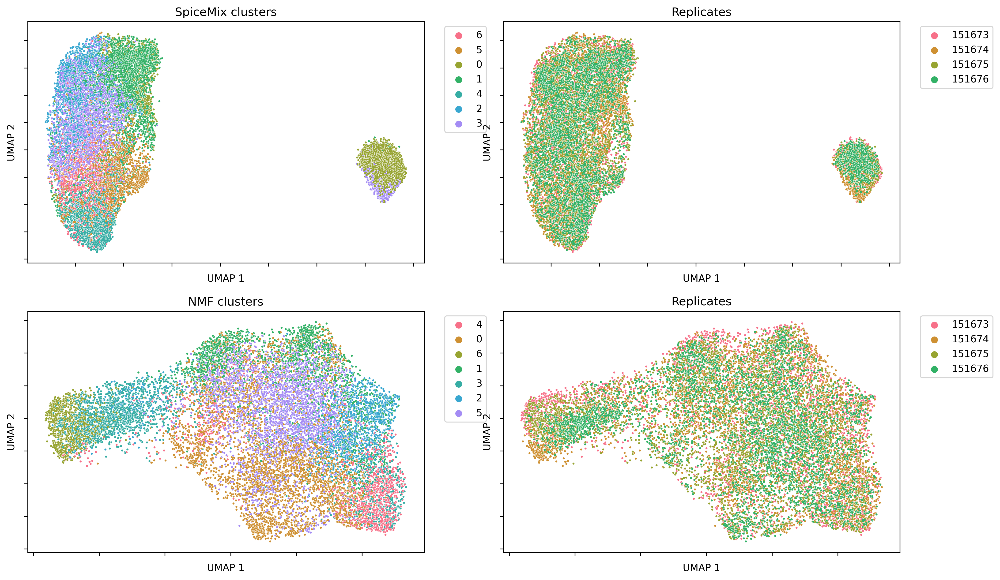

In [31]:
# Visualize cells in the latent space colored by
#   SpiceMix/NMF clusters (cluster)
#   cell types from the original analysis (cell type)
#   replicates (repli)
# Result.visualizeFeaturesSpace is a wraper of Result.visualizeFeatureSpace and handles the custom order of metagenes
kwargs = dict(s=5)
fig, axes = plt.subplots(2, 2, figsize=(16, 10))
STARmap_spatial_result.plot_feature(axes[0, 0], 'cluster', key_x='UMAP 1', key_y='UMAP 2', **kwargs)
STARmap_spatial_result.plot_feature(axes[0, 1], 'replicate', key_x='UMAP 1', key_y='UMAP 2', **kwargs)

STARmap_nmf_result.plot_feature(axes[1, 0], 'cluster', key_x='UMAP 1', key_y='UMAP 2', **kwargs)
STARmap_nmf_result.plot_feature(axes[1, 1], 'replicate', key_x='UMAP 1', key_y='UMAP 2', **kwargs)

axes[0, 0].set_title('SpiceMix clusters')
axes[0, 1].set_title('Replicates')
axes[1, 0].set_title('NMF clusters')
axes[1, 1].set_title('Replicates')

AttributeError: 'SpiceMixResult' object has no attribute 'visualizeLabelEnrichment'

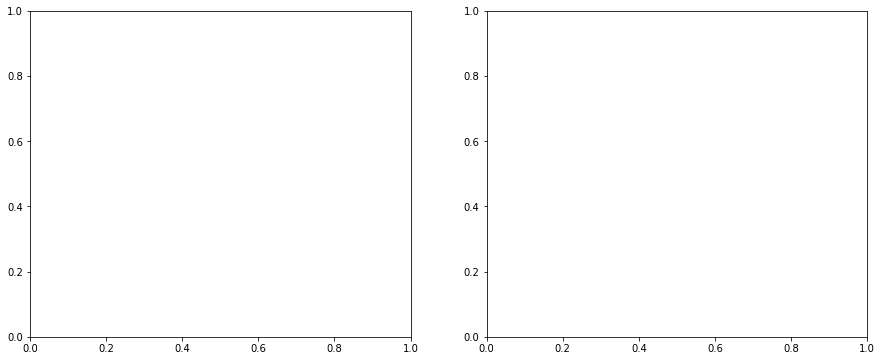

In [54]:
segmentdata = copy.deepcopy(plt.get_cmap('YlGn')._segmentdata)
segmentdata['red'  ][0] = (0., 1., 1.)
segmentdata['green'][0] = (0., 1., 1.)
segmentdata['blue' ][0] = (0., 1., 1.)
cm = LinearSegmentedColormap('', segmentdata=segmentdata, N=256)
kwargs = dict(
    cmap=cm,
)


spatial_cluster_order = ["12", "15", "7", "12", "14", "9", "7", "3", "2", "13", "8", "11", "0", "5", "6", "1"]

# compare SpiceMix/NMF clusters with the cell types from the original analysis
fig, axes = plt.subplots(1, 2, figsize=(15, 6))
STARmap_spatial_result.visualizeLabelEnrichment(axes[0], order_x=spatial_cluster_order, **kwargs)
STARmap_nmf_result.visualizeLabelEnrichment(axes[1], **kwargs)

# the distribution of SpiceMix/NMF clusters in different replicates
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

STARmap_spatial_result.visualizeLabelEnrichment(axes[0], **kwargs, key_x='cluster', key_y='replicate', ignores_x={'NA'})
STARmap_nmf_result.visualizeLabelEnrichment(axes[1], **kwargs, key_x='cluster', key_y='replicate')

In [32]:
adjacency_lists = STARmap_spatial_result.dataset["Es"][replicate]
num_metagenes = STARmap_spatial_result.hyperparameters["K"]

empirical_spicemix_affinities = np.zeros((num_metagenes, num_metagenes))
embeddings = STARmap_spatial_result.data[STARmap_spatial_result.weight_columns].values
embeddings /= embeddings.sum(axis=1, keepdims=True)

print(embeddings)

empirical_matches = [[[] for _ in range(num_metagenes)] for _ in range(num_metagenes)]
for cell, adjacency_list in adjacency_lists.items():
    cell = int(cell)
    cell_embedding = embeddings[cell]
    # average_adjacent_embedding = embeddings[adjacency_list].mean(axis=0)
    for adjacent_cell in adjacency_list:
        adjacent_embedding = embeddings[adjacent_cell]
        for first_metagene in range(num_metagenes):
            for second_metagene in range(first_metagene, num_metagenes):
                match = cell_embedding[first_metagene], adjacent_embedding[second_metagene]
                empirical_matches[first_metagene][second_metagene].append(match)

for first_metagene in range(num_metagenes):
    for second_metagene in range(first_metagene, num_metagenes):
        x, y = np.array(empirical_matches[first_metagene][second_metagene]).T
        empirical_spicemix_affinities[first_metagene][second_metagene], _ = pearsonr(x, y)
        
empirical_spicemix_affinities += empirical_spicemix_affinities.T - np.diag(np.diag(empirical_spicemix_affinities))

[[2.80274133e-11 3.04597674e-04 1.52548271e-11 ... 7.32837575e-04
  2.31777830e-11 4.34462067e-04]
 [1.99081572e-11 1.51830439e-03 2.66822497e-11 ... 1.92457697e-03
  1.97417079e-02 1.12908419e-09]
 [5.76045975e-01 3.00030102e-03 4.27337785e-12 ... 1.40413346e-03
  1.08132688e-11 6.71075360e-04]
 ...
 [6.34063903e-01 6.93884723e-03 2.27880266e-04 ... 1.26231945e-03
  7.69954274e-03 6.48919522e-10]
 [2.73279102e-10 5.11694885e-03 1.34756904e-02 ... 2.58858938e-03
  4.53205984e-03 1.32079392e-10]
 [2.75786136e-12 1.51456286e-09 4.77021328e-03 ... 1.14688539e-03
  1.32941694e-02 1.33086887e-12]]


In [42]:
adjacency_lists = STARmap_spatial_result.dataset["Es"][replicate]
num_metagenes = STARmap_nmf_result.hyperparameters["K"]

empirical_nmf_affinities = np.zeros((num_metagenes, num_metagenes))
embeddings = STARmap_nmf_result.data[STARmap_nmf_result.weight_columns].values
embeddings /= embeddings.sum(axis=1, keepdims=True)

empirical_matches = [[[] for _ in range(num_metagenes)] for _ in range(num_metagenes)]
for cell, adjacency_list in adjacency_lists.items():
    cell = int(cell)
    cell_embedding = embeddings[cell]
    # average_adjacent_embedding = embeddings[adjacency_list].mean(axis=0)
    for adjacent_cell in adjacency_list:
        adjacent_embedding = embeddings[adjacent_cell]
        for first_metagene in range(num_metagenes):
            for second_metagene in range(first_metagene, num_metagenes):
                match = cell_embedding[first_metagene], adjacent_embedding[second_metagene]
                empirical_matches[first_metagene][second_metagene].append(match)

for first_metagene in range(num_metagenes):
    for second_metagene in range(first_metagene, num_metagenes):
        x, y = np.array(empirical_matches[first_metagene][second_metagene]).T
        empirical_nmf_affinities[first_metagene][second_metagene], _ = pearsonr(x, y)
        
empirical_nmf_affinities += empirical_nmf_affinities.T - np.diag(np.diag(empirical_nmf_affinities))

Text(0.5, 1.0, 'NMF Empirical Metagene Correlation')

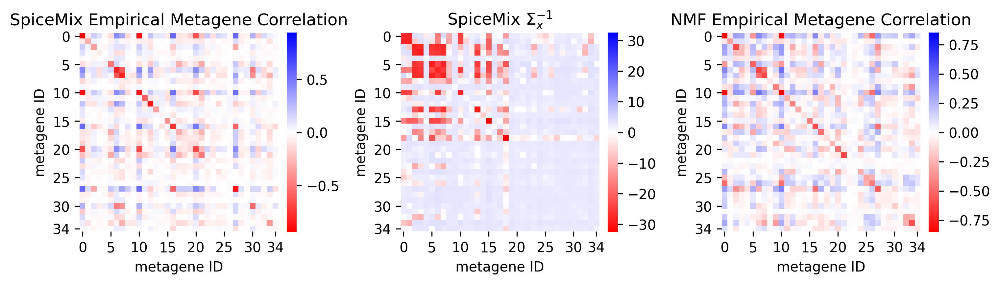

In [43]:
segmentdata = copy.deepcopy(plt.get_cmap('bwr')._segmentdata)
for key in ['red', 'green', 'blue']:
    segmentdata[key] = [(1.-i, k, j) for (i, j, k) in segmentdata[key][::-1]]
cm = LinearSegmentedColormap('', segmentdata=segmentdata, N=256)
kwargs = dict(
    cmap=cm,
)

empirical_metagene_correlations = STARmap_spatial_result.calculate_metagene_correlations("151673", STARmap_spatial_result.data[STARmap_spatial_result.data["replicate"] == "151673"], STARmap_spatial_result.weight_columns)

fig, axes = plt.subplots(1, 3, figsize=(10, 10))
STARmap_spatial_result.plot_metagene_heatmap(axes[0], -empirical_spicemix_affinities.astype(float), cmap=cm)
STARmap_spatial_result.plot_affinity_metagenes(axes[1], cmap=cm)
STARmap_spatial_result.plot_metagene_heatmap(axes[2], -empirical_nmf_affinities.astype(float), cmap=cm)

# axes[0].plot(axes[0, 0], 'cluster', key_x='UMAP 1', key_y='UMAP 2', **kwargs)
# axes[1].plot_feature(axes[0, 1], 'replicate', key_x='UMAP 1', key_y='UMAP 2', **kwargs)

# STARmap_nmf_result.plot_feature(axes[1, 0], 'cluster', key_x='UMAP 1', key_y='UMAP 2', **kwargs)
# STARmap_nmf_result.plot_feature(axes[1, 1], 'replicate', key_x='UMAP 1', key_y='UMAP 2', **kwargs)

plt.tight_layout()
axes[0].set_title('SpiceMix Empirical Metagene Correlation')
axes[1].set_title('SpiceMix $\Sigma_x^{-1}$')
axes[2].set_title('NMF Empirical Metagene Correlation')

In [44]:
STARmap_spatial_result.dataset["gene_sets"]

{'151673': array(['0', '1', '2', ..., '3191', '3192', '3193'], dtype='<U4'),
 '151674': array(['0', '1', '2', ..., '3191', '3192', '3193'], dtype='<U4'),
 '151675': array(['0', '1', '2', ..., '3191', '3192', '3193'], dtype='<U4'),
 '151676': array(['0', '1', '2', ..., '3191', '3192', '3193'], dtype='<U4')}

## Training and predicting on same FOV

In [14]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC

from sklearn.metrics import accuracy_score

In [15]:
index = STARmap_spatial_result.data["replicate"] == "151673"

In [16]:
data =  STARmap_spatial_result.data[index]

labels = data["label"].values
features = data[STARmap_spatial_result.weight_columns].values

num_samples = len(labels) * 7 // 10
train_labels, test_labels = labels[:num_samples], labels[num_samples:]
train_features, test_features = features[:num_samples], features[num_samples:]

clf = make_pipeline(StandardScaler(), SVC(gamma='auto'))
clf.fit(train_features, train_labels)

clf.predict(test_features)

array(['L5', 'L6', 'L3', ..., 'L6', 'WM', 'L2'], dtype=object)

In [17]:
accuracy_score(test_labels, clf.predict(test_features))

0.8278388278388278

In [18]:
data =  STARmap_nmf_result.data[index]

labels = data["label"].values
features = data[STARmap_nmf_result.weight_columns].values

num_samples = len(labels) * 7 // 10
train_labels, test_labels = labels[:num_samples], labels[num_samples:]
train_features, test_features = features[:num_samples], features[num_samples:]

clf = make_pipeline(StandardScaler(), SVC(gamma='auto'))
clf.fit(train_features, train_labels)

clf.predict(test_features)

array(['L5', 'L6', 'L4', ..., 'L6', 'WM', 'L2'], dtype=object)

In [19]:
accuracy_score(test_labels, clf.predict(test_features))

0.8241758241758241

## Training and predicting on different FOVs

In [20]:
train_index = STARmap_spatial_result.data["replicate"] == "151673"
test_index = STARmap_spatial_result.data["replicate"] == "151676"

In [21]:
train_data =  STARmap_spatial_result.data[train_index]

train_labels = train_data["label"].values
train_features = train_data[STARmap_spatial_result.weight_columns].values

test_data =  STARmap_spatial_result.data[test_index]

test_labels = test_data["label"].values
test_features = test_data[STARmap_spatial_result.weight_columns].values

clf = make_pipeline(StandardScaler(), SVC(gamma='auto'))
clf.fit(train_features, train_labels)

clf.predict(test_features)

array(['L3', 'L1', 'WM', ..., 'WM', 'L6', 'L1'], dtype=object)

In [22]:
accuracy_score(test_labels, clf.predict(test_features))

0.7473988439306358

In [23]:
train_data =  STARmap_nmf_result.data[train_index]

train_labels = train_data["label"].values
train_features = train_data[STARmap_nmf_result.weight_columns].values

test_data =  STARmap_nmf_result.data[test_index]

test_labels = test_data["label"].values
test_features = test_data[STARmap_nmf_result.weight_columns].values


from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
clf = make_pipeline(StandardScaler(), SVC(gamma='auto'))
clf.fit(train_features, train_labels)

clf.predict(test_features)

array(['L3', 'L6', 'WM', ..., 'L6', 'L6', 'L1'], dtype=object)

In [24]:
accuracy_score(test_labels, clf.predict(test_features))

0.7355491329479769

## Random seed exploration


In [7]:
# Previous runs
spatialLIBD_K_35_lowest_lambda_four_fovs_results = []
for seed in range(8):
    spatialLIBD_result = SpiceMixResult(
        path2dataset='../../data/spatialLIBD',
        result_filename=f"../../data/spatialLIBD/results_with_spatial_K_35_lowest_lambda_four_fovs_random_seed_{seed}.hdf5",
        neighbor_suffix="",
    )
    spatialLIBD_K_35_lowest_lambda_four_fovs_results.append(spatialLIBD_result)

Result file = ../../data/spatialLIBD/results_with_spatial_K_35_lowest_lambda_four_fovs_random_seed_0.hdf5
Result file = ../../data/spatialLIBD/results_with_spatial_K_35_lowest_lambda_four_fovs_random_seed_1.hdf5
Result file = ../../data/spatialLIBD/results_with_spatial_K_35_lowest_lambda_four_fovs_random_seed_2.hdf5
Result file = ../../data/spatialLIBD/results_with_spatial_K_35_lowest_lambda_four_fovs_random_seed_3.hdf5
Result file = ../../data/spatialLIBD/results_with_spatial_K_35_lowest_lambda_four_fovs_random_seed_4.hdf5
Result file = ../../data/spatialLIBD/results_with_spatial_K_35_lowest_lambda_four_fovs_random_seed_5.hdf5
Result file = ../../data/spatialLIBD/results_with_spatial_K_35_lowest_lambda_four_fovs_random_seed_6.hdf5
Result file = ../../data/spatialLIBD/results_with_spatial_K_35_lowest_lambda_four_fovs_random_seed_7.hdf5


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/util.py:116: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  ans[key] = item.value
/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/util.py:116: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  ans[key] = item.value


Found 210 iterations from ../../data/spatialLIBD/results_with_spatial_K_35_lowest_lambda_four_fovs_random_seed_0.hdf5
Iteration 10


Found 108 iterations from ../../data/spatialLIBD/results_with_spatial_K_35_lowest_lambda_four_fovs_random_seed_1.hdf5
Iteration 10


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/util.py:116: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  ans[key] = item.value


Found 114 iterations from ../../data/spatialLIBD/results_with_spatial_K_35_lowest_lambda_four_fovs_random_seed_2.hdf5
Iteration 10


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/util.py:116: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  ans[key] = item.value


Found 111 iterations from ../../data/spatialLIBD/results_with_spatial_K_35_lowest_lambda_four_fovs_random_seed_3.hdf5
Iteration 10


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/util.py:116: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  ans[key] = item.value


Found 114 iterations from ../../data/spatialLIBD/results_with_spatial_K_35_lowest_lambda_four_fovs_random_seed_4.hdf5
Iteration 10


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/util.py:116: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  ans[key] = item.value


Found 115 iterations from ../../data/spatialLIBD/results_with_spatial_K_35_lowest_lambda_four_fovs_random_seed_5.hdf5
Iteration 10


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/util.py:116: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  ans[key] = item.value


Found 109 iterations from ../../data/spatialLIBD/results_with_spatial_K_35_lowest_lambda_four_fovs_random_seed_6.hdf5
Iteration 10


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/util.py:116: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  ans[key] = item.value


Found 234 iterations from ../../data/spatialLIBD/results_with_spatial_K_35_lowest_lambda_four_fovs_random_seed_7.hdf5
Iteration 10


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/util.py:116: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  ans[key] = item.value


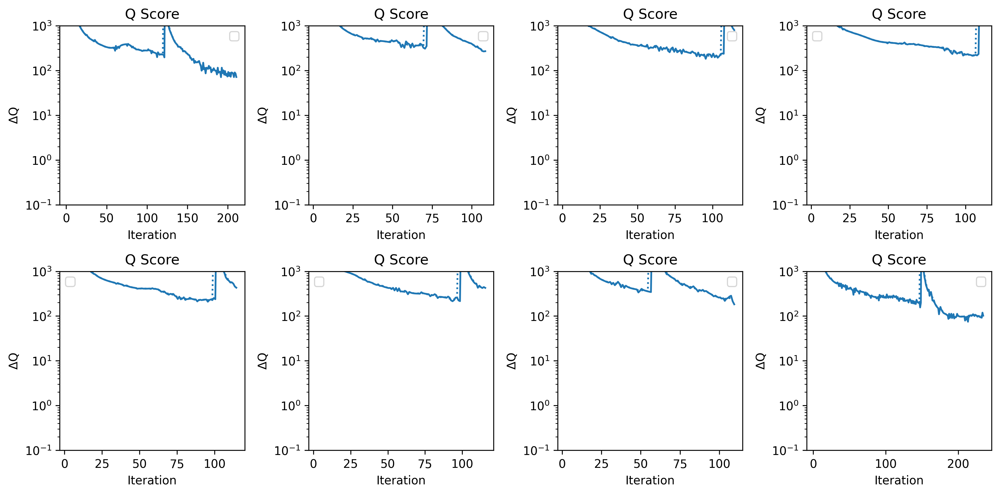

In [14]:
fig, axes = plt.subplots(2, 4, figsize=(12, 6))
for index, (ax, result) in enumerate(zip(axes.flat, spatialLIBD_K_35_lowest_lambda_four_fovs_results)):
    result.plot_convergence(ax, label=f'Random seed = {index}', c='C0')
    result.load_latent_states(iiter=10)
    
plt.tight_layout()

In [15]:
ari_scores = []
fov_specific_ari_scores = []
for result in spatialLIBD_K_35_lowest_lambda_four_fovs_results:
    result.determine_clusters(7)
    ari_score = result.calculate_ari_score()
    ari_scores.append(ari_score)
    filtered_metagenes = result.filter_metagenes(spatial_threshold=0.9, magnitude_threshold=0.7)
    result.determine_clusters(7, filtered_metagenes, replicate="151673")
    fov_specific_ari_score = result.calculate_ari_score(replicate="151673")
    fov_specific_ari_scores.append(fov_specific_ari_score)

In [16]:
print(ari_scores)
print(fov_specific_ari_scores)

[0.3664907504374697, 0.45837241549744373, 0.338429164322326, 0.410873989868155, 0.28580918550364137, 0.22472901182969596, 0.2153644462359215, 0.2885769136057682]
[0.394539034562988, 0.4725571643524343, 0.3243511784208868, 0.29754308862078144, 0.3203022167223826, 0.24222448554680456, 0.2438506367194403, 0.29815251649359975]


{'whiskers': [<matplotlib.lines.Line2D at 0x7fd007332e90>,
 'caps': [<matplotlib.lines.Line2D at 0x7fd0074bb510>,
 'boxes': [<matplotlib.lines.Line2D at 0x7fd0073327d0>,
 'medians': [<matplotlib.lines.Line2D at 0x7fd007315290>,
 'fliers': [<matplotlib.lines.Line2D at 0x7fd0073bb950>,
 'means': []}

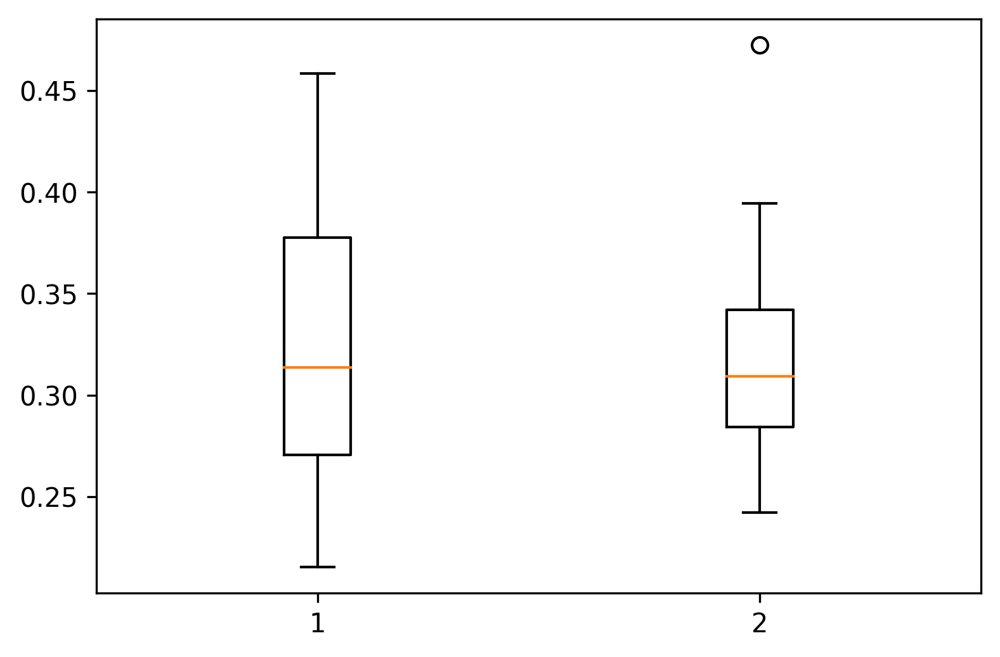

In [17]:
plt.boxplot([ari_scores, fov_specific_ari_scores])

## Correlating metagenes with layers

In [44]:
layers = spatialLIBD_K_35_lowest_lambda_four_fovs_results[0].data["label"].unique()
label_grouping = spatialLIBD_K_35_lowest_lambda_four_fovs_results[0].data.groupby('label')
for layer in layers:
    group = label_grouping.get_group(layer)
    category_means = group[filtered_metagenes].sum(axis=0)
    top_metagenes = np.argsort(category_means.values)[::-1]
    print(filtered_metagenes[top_metagenes])

['Metagene 6' 'Metagene 27' 'Metagene 16' 'Metagene 7' 'Metagene 30'
 'Metagene 12' 'Metagene 13' 'Metagene 14' 'Metagene 20' 'Metagene 11'
 'Metagene 5' 'Metagene 1' 'Metagene 10' 'Metagene 0']
['Metagene 7' 'Metagene 6' 'Metagene 16' 'Metagene 27' 'Metagene 30'
 'Metagene 12' 'Metagene 13' 'Metagene 20' 'Metagene 14' 'Metagene 5'
 'Metagene 10' 'Metagene 11' 'Metagene 1' 'Metagene 0']
['Metagene 0' 'Metagene 10' 'Metagene 12' 'Metagene 20' 'Metagene 27'
 'Metagene 6' 'Metagene 13' 'Metagene 7' 'Metagene 30' 'Metagene 16'
 'Metagene 5' 'Metagene 14' 'Metagene 11' 'Metagene 1']
['Metagene 27' 'Metagene 12' 'Metagene 16' 'Metagene 6' 'Metagene 7'
 'Metagene 30' 'Metagene 20' 'Metagene 13' 'Metagene 14' 'Metagene 11'
 'Metagene 5' 'Metagene 0' 'Metagene 1' 'Metagene 10']
['Metagene 12' 'Metagene 27' 'Metagene 6' 'Metagene 7' 'Metagene 16'
 'Metagene 30' 'Metagene 20' 'Metagene 0' 'Metagene 10' 'Metagene 13'
 'Metagene 11' 'Metagene 14' 'Metagene 5' 'Metagene 1']
['Metagene 6' 'Metagene 7

In [ ]:
from scipy.stats import ranksums
layer_metagene_values = []
for layer in layers:
    group = label_grouping.get_group(layer)
    metagene_values = group[filtered_metagenes].values
    layer_metagene_values.append(metagene_values)
    


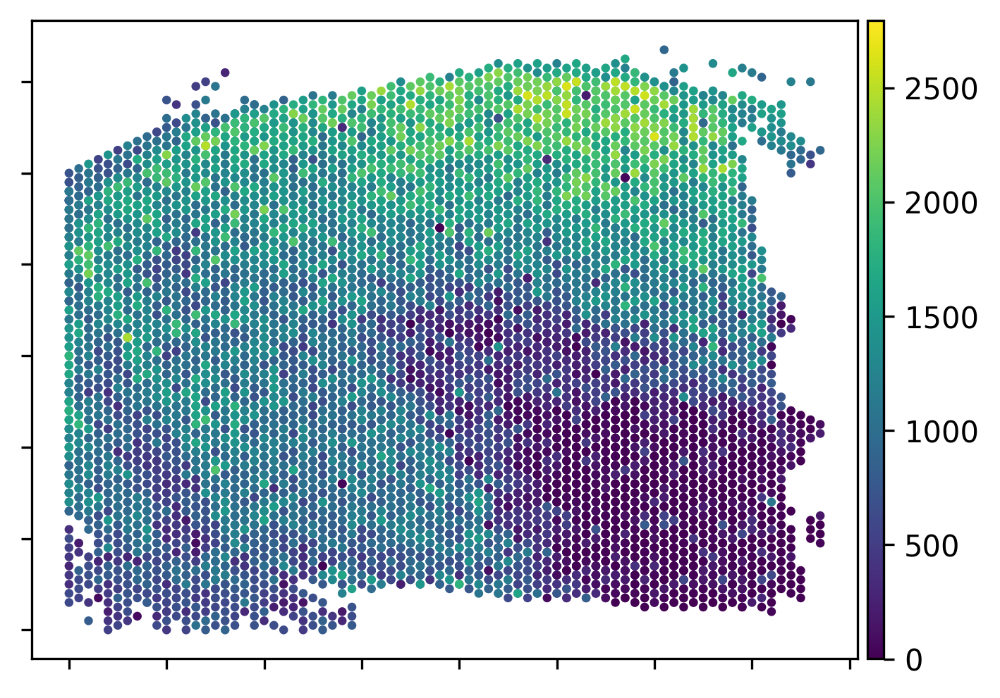

In [48]:
fig, ax = plt.subplots()
spatialLIBD_results[0].plot_aggregated_feature(ax, ["Metagene 6", "Metagene 27", "Metagene 7"], s=4)

## Refining clusters with smoothing

In [59]:
def refine(sample_ids, clustering, dis, shape="hexagon"):
    refined_pred=[]
    pred = pd.DataFrame({"pred": clustering}, index=sample_ids)
    dis_df = pd.DataFrame(dis, index=sample_ids, columns=sample_ids)
    
    if shape=="hexagon":
        num_neighbors=6 
    elif shape=="square":
        num_neighbors=4
    else:
        print("Shape not recognized")
        
    for index in sample_ids:
        dis_tmp=dis_df.loc[index, :].sort_values()
        neighbors=dis_tmp[0:num_neighbors+1]
        neighbors_pred=pred.loc[neighbors.index, "pred"]
        self_pred=pred.loc[index, "pred"]
        v_c=neighbors_pred.value_counts()
        if (v_c.loc[self_pred] < num_neighbors/2) and (np.max(v_c) > num_neighbors/2):
            refined_pred.append(v_c.idxmax())
        else:           
            refined_pred.append(self_pred)
            
    return refined_pred

In [60]:
def iteratively_refine(sample_ids, clustering, dis):
    refined_clustering = refine(sample_ids, clustering, dis)
    while list(refined_clustering) != list(clustering):
        clustering = refined_clustering
        refined_clustering = refine(sample_ids, clustering, dis)
        
    return clustering

In [61]:
coordinates = spatialLIBD_results[0].data[["x", "y"]].values
distance_matrix = pairwise_distances(coordinates)

refined_ari_scores = []
for result in spatialLIBD_results:
    result.data["cluster"] = refine(result.data.index.tolist(), result.data["cluster"], distance_matrix)
    refined_ari_score = result.calculate_ari_score()
    refined_ari_scores.append(refined_ari_score)

In [62]:
print(refined_ari_scores)

[0.2865488686485759, 0.20100375970968085, 0.37312482724276835, 0.32186986103312804, 0.18911032229159297, 0.29126415650035414, 0.1895885033406159, 0.19487203815077672]


## ARI Score Boxplots

In [11]:
spatialLIBD_single_fov_results = []
K_values = list(range(20, 40, 5))
lambda_values = ["1e-12", "1e-8", "1e-4"]
for K in K_values:
    K_results = []
    for lambda_value in lambda_values:
        seed_results = []
        for seed in range(10, 12):
            spatialLIBD_result = SpiceMixResult(
                path2dataset='../../data/spatialLIBD',
                result_filename=f"../../data/spatialLIBD/results_with_spatial_K_{K}_lambda_{lambda_value}_single_fov_random_seed_{seed}.hdf5",
                neighbor_suffix="",
            )
            spatialLIBD_result.load_latent_states(iiter=-1)
            spatialLIBD_result.determine_clusters(7)
            seed_results.append(spatialLIBD_result)
        K_results.append(seed_results)
    spatialLIBD_single_fov_results.append(K_results)

Result file = ../../data/spatialLIBD/results_with_spatial_K_20_lambda_1e-12_single_fov_random_seed_10.hdf5
[b'HES4' b'ISG15' b'SDF4' ... b'ND6' b'CYTB' b'LOC102724770']
Iteration -1
Result file = ../../data/spatialLIBD/results_with_spatial_K_20_lambda_1e-12_single_fov_random_seed_11.hdf5


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/util.py:116: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  ans[key] = item.value


[b'HES4' b'ISG15' b'SDF4' ... b'ND6' b'CYTB' b'LOC102724770']
Iteration -1
Result file = ../../data/spatialLIBD/results_with_spatial_K_20_lambda_1e-8_single_fov_random_seed_10.hdf5


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/util.py:116: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  ans[key] = item.value


[b'HES4' b'ISG15' b'SDF4' ... b'ND6' b'CYTB' b'LOC102724770']
Iteration -1
Result file = ../../data/spatialLIBD/results_with_spatial_K_20_lambda_1e-8_single_fov_random_seed_11.hdf5


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/util.py:116: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  ans[key] = item.value


[b'HES4' b'ISG15' b'SDF4' ... b'ND6' b'CYTB' b'LOC102724770']
Iteration -1
Result file = ../../data/spatialLIBD/results_with_spatial_K_20_lambda_1e-4_single_fov_random_seed_10.hdf5


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/util.py:116: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  ans[key] = item.value


[b'HES4' b'ISG15' b'SDF4' ... b'ND6' b'CYTB' b'LOC102724770']
Iteration -1
Result file = ../../data/spatialLIBD/results_with_spatial_K_20_lambda_1e-4_single_fov_random_seed_11.hdf5


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/util.py:116: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  ans[key] = item.value


[b'HES4' b'ISG15' b'SDF4' ... b'ND6' b'CYTB' b'LOC102724770']
Iteration -1
Result file = ../../data/spatialLIBD/results_with_spatial_K_25_lambda_1e-12_single_fov_random_seed_10.hdf5


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/util.py:116: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  ans[key] = item.value


[b'HES4' b'ISG15' b'SDF4' ... b'ND6' b'CYTB' b'LOC102724770']
Iteration -1
Result file = ../../data/spatialLIBD/results_with_spatial_K_25_lambda_1e-12_single_fov_random_seed_11.hdf5


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/util.py:116: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  ans[key] = item.value


[b'HES4' b'ISG15' b'SDF4' ... b'ND6' b'CYTB' b'LOC102724770']
Iteration -1
Result file = ../../data/spatialLIBD/results_with_spatial_K_25_lambda_1e-8_single_fov_random_seed_10.hdf5


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/util.py:116: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  ans[key] = item.value


[b'HES4' b'ISG15' b'SDF4' ... b'ND6' b'CYTB' b'LOC102724770']
Iteration -1
Result file = ../../data/spatialLIBD/results_with_spatial_K_25_lambda_1e-8_single_fov_random_seed_11.hdf5


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/util.py:116: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  ans[key] = item.value


[b'HES4' b'ISG15' b'SDF4' ... b'ND6' b'CYTB' b'LOC102724770']
Iteration -1
Result file = ../../data/spatialLIBD/results_with_spatial_K_25_lambda_1e-4_single_fov_random_seed_10.hdf5


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/util.py:116: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  ans[key] = item.value


[b'HES4' b'ISG15' b'SDF4' ... b'ND6' b'CYTB' b'LOC102724770']
Iteration -1
Result file = ../../data/spatialLIBD/results_with_spatial_K_25_lambda_1e-4_single_fov_random_seed_11.hdf5


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/util.py:116: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  ans[key] = item.value


[b'HES4' b'ISG15' b'SDF4' ... b'ND6' b'CYTB' b'LOC102724770']
Iteration -1
Result file = ../../data/spatialLIBD/results_with_spatial_K_30_lambda_1e-12_single_fov_random_seed_10.hdf5


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/util.py:116: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  ans[key] = item.value


[b'HES4' b'ISG15' b'SDF4' ... b'ND6' b'CYTB' b'LOC102724770']
Iteration -1
Result file = ../../data/spatialLIBD/results_with_spatial_K_30_lambda_1e-12_single_fov_random_seed_11.hdf5


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/util.py:116: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  ans[key] = item.value


[b'HES4' b'ISG15' b'SDF4' ... b'ND6' b'CYTB' b'LOC102724770']
Iteration -1
Result file = ../../data/spatialLIBD/results_with_spatial_K_30_lambda_1e-8_single_fov_random_seed_10.hdf5


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/util.py:116: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  ans[key] = item.value


[b'HES4' b'ISG15' b'SDF4' ... b'ND6' b'CYTB' b'LOC102724770']
Iteration -1
Result file = ../../data/spatialLIBD/results_with_spatial_K_30_lambda_1e-8_single_fov_random_seed_11.hdf5


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/util.py:116: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  ans[key] = item.value


[b'HES4' b'ISG15' b'SDF4' ... b'ND6' b'CYTB' b'LOC102724770']
Iteration -1
Result file = ../../data/spatialLIBD/results_with_spatial_K_30_lambda_1e-4_single_fov_random_seed_10.hdf5


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/util.py:116: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  ans[key] = item.value


[b'HES4' b'ISG15' b'SDF4' ... b'ND6' b'CYTB' b'LOC102724770']
Iteration -1
Result file = ../../data/spatialLIBD/results_with_spatial_K_30_lambda_1e-4_single_fov_random_seed_11.hdf5


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/util.py:116: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  ans[key] = item.value


[b'HES4' b'ISG15' b'SDF4' ... b'ND6' b'CYTB' b'LOC102724770']
Iteration -1
Result file = ../../data/spatialLIBD/results_with_spatial_K_35_lambda_1e-12_single_fov_random_seed_10.hdf5


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/util.py:116: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  ans[key] = item.value


[b'HES4' b'ISG15' b'SDF4' ... b'ND6' b'CYTB' b'LOC102724770']
Iteration -1
Result file = ../../data/spatialLIBD/results_with_spatial_K_35_lambda_1e-12_single_fov_random_seed_11.hdf5


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/util.py:116: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  ans[key] = item.value


[b'HES4' b'ISG15' b'SDF4' ... b'ND6' b'CYTB' b'LOC102724770']
Iteration -1
Result file = ../../data/spatialLIBD/results_with_spatial_K_35_lambda_1e-8_single_fov_random_seed_10.hdf5


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/util.py:116: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  ans[key] = item.value


[b'HES4' b'ISG15' b'SDF4' ... b'ND6' b'CYTB' b'LOC102724770']
Iteration -1
Result file = ../../data/spatialLIBD/results_with_spatial_K_35_lambda_1e-8_single_fov_random_seed_11.hdf5


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/util.py:116: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  ans[key] = item.value


[b'HES4' b'ISG15' b'SDF4' ... b'ND6' b'CYTB' b'LOC102724770']
Iteration -1
Result file = ../../data/spatialLIBD/results_with_spatial_K_35_lambda_1e-4_single_fov_random_seed_10.hdf5


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/util.py:116: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  ans[key] = item.value


[b'HES4' b'ISG15' b'SDF4' ... b'ND6' b'CYTB' b'LOC102724770']
Iteration -1
Result file = ../../data/spatialLIBD/results_with_spatial_K_35_lambda_1e-4_single_fov_random_seed_11.hdf5


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/util.py:116: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  ans[key] = item.value


[b'HES4' b'ISG15' b'SDF4' ... b'ND6' b'CYTB' b'LOC102724770']
Iteration -1


In [21]:
#ari_scores = [[[result.calculate_ari_score() for result in seed_results] for seed_results in K_results] for K_results in spatialLIBD_single_fov_results]

Q = [[[result.progress["Q"] for result in seed_results] for seed_results in K_results] for K_results in spatialLIBD_single_fov_results]
print(ari_scores)
fig, ax = plt.subplots()

ari_dataframe = pd.DataFrame(np.mean(ari_scores, axis=2), index = K_values, columns = lambda_values)
heatmap = sns.heatmap(ari_dataframe, annot=True, fmt=".2f")
ax.set_ylabel("$K$")
ax.set_xlabel("$\lambda_{\Sigma}$")

AttributeError: 'SpiceMixResult' object has no attribute 'progress'

## Marker-genes vs metagenes

In [13]:
spatial_metagene_index[::-1]

NameError: name 'spatial_metagene_index' is not defined

In [ ]:
HPCAL1_expression = STARmap_spatial_result.data["HPCAL1"].values
HPCAL1_index, = np.where(STARmap_spatial_result.data.columns == "HPCAL1")
metagene_weights = STARmap_spatial_result.data[STARmap_spatial_result.weight_columns]

In [ ]:
metagene_constitution = STARmap_spatial_result.parameters["M"][-1]
ranked_genes =np.argsort(metagene_constitution, axis=0)

HPCAL1_ranks, HPCAL1_metagenes = np.where(ranked_genes == HPCAL1_index)
print(metagene_constitution.sum(axis=0))

#plt.scatter(spatial_moran_distribution, )

In [ ]:
HPCAL1_ranks

In [ ]:
STARmap_spatial_result.data.columns[ranked_genes[:10, 0]]

In [ ]:
fig, ax = plt.subplots(2, 3)
STARmap_spatial_result.plot_multifeature(ax, ["GET1", "RPS13", "ATP6V0E1", "TPD52", "FAM234B"], "151673", s=0.2)

In [ ]:
fig, ax = plt.subplots(2, 3)
STARmap_spatial_result.plot_multifeature(ax, ["Metagene 10"], "151673", s=0.2)

## Correlation with known cell types

In [5]:
expression_data = pd.read_csv("../../tasic_2016_dataset/GSE71585_RefSeq_RPKM.csv")

In [6]:
clustering_results = pd.read_csv("../../tasic_2016_dataset/GSE71585_Clustering_Results.csv")
clustering_results

,sample_title,mouse_line,cre_driver_1,cre_driver_2,cre_reporter,dissection,tdTomato,pass_qc_checks,broad_type,core_intermediate,primary_type,secondary_type,aibs_vignette_id
0,Calb2_tdTpositive_cell_46,Calb2,Calb2-IRES-Cre,NaN,RCL-tdT (Ai14),upper,positive,Y,Astrocyte,core,Astro Gja1,NaN,A1631_VU
1,Calb2_tdTpositive_cell_48,Calb2,Calb2-IRES-Cre,NaN,RCL-tdT (Ai14),upper,positive,Y,Astrocyte,core,Astro Gja1,NaN,A1633_VU
2,Calb2_tdTpositive_cell_50,Calb2,Calb2-IRES-Cre,NaN,RCL-tdT (Ai14),lower,positive,Y,Astrocyte,core,Astro Gja1,NaN,A1635_VL
3,Calb2_tdTpositive_cell_53,Calb2,Calb2-IRES-Cre,NaN,RCL-tdT (Ai14),lower,positive,Y,Astrocyte,core,Astro Gja1,NaN,A1638_VL
4,Calb2_tdTpositive_cell_58,Calb2,Calb2-IRES-Cre,NaN,RCL-tdT (Ai14),lower,positive,Y,Astrocyte,core,Astro Gja1,NaN,A1643_VL
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1804,Vip_tdTpositive_cell_2,Vip,Vip-IRES-Cre,NaN,RCL-tdT (Ai14),upper,positive,Y,GABA-ergic Neuron,core,Vip Sncg,NaN,V736_VU
1805,Vip_tdTpositive_cell_3,Vip,Vip-IRES-Cre,NaN,RCL-tdT (Ai14),upper,positive,Y,GABA-ergic Neuron,core,Vip Sncg,NaN,V737_VU
1806,Vip_tdTpositive_cell_15,Vip,Vip-IRES-Cre,NaN,RCL-tdT (Ai14),upper,positive,Y,GABA-ergic Neuron,core,Vip Sncg,NaN,V750_VU
1807,Vip_tdTpositive_cell_17,Vip,Vip-IRES-Cre,NaN,RCL-tdT (Ai14),upper,positive,Y,GABA-ergic Neuron,core,Vip Sncg,NaN,V752_VU


In [10]:
spicemix_genes = STARmap_spatial_result.dataset["gene_sets"]["151675"]

In [11]:
spicemix_genes.shape

(3194,)

In [12]:
tasic_genes = expression_data["gene"].values
uppercase_genes = np.char.upper(tasic_genes.astype("U"))
matching_index = np.isin(uppercase_genes, spicemix_genes)

In [13]:
expression_data_subset = expression_data[matching_index]
common_genes = expression_data_subset["gene"].values

In [14]:
cell_types = clustering_results["broad_type"].unique()

In [15]:
mean_expression_data = np.zeros((len(common_genes), 8))
for cell_type_index, cell_type in enumerate(cell_types):
    index = clustering_results["broad_type"] == cell_type
    expression_data_index = clustering_results["sample_title"][index]
    cell_type_expression_data_subset = expression_data_subset[expression_data_index]
    mean_cell_type_expression_data_subset = cell_type_expression_data_subset.values.mean(axis=1)
    mean_expression_data[:, cell_type_index] = mean_cell_type_expression_data_subset

In [16]:
average_cell_type_data = pd.DataFrame(mean_expression_data, columns=cell_types, index=common_genes)

In [17]:
spicemix_common_gene_index = np.isin(STARmap_spatial_result.dataset["gene_sets"]["151673"], uppercase_genes)
metagene_definitions = STARmap_spatial_result.parameters["M"][-1][spicemix_common_gene_index]

In [20]:
from scipy.stats import pearsonr

correlation_results = []
for metagene in metagene_definitions.T:
    metagene_results = []
    for cell_type_definition in average_cell_type_data.values.T:
        r, _ = pearsonr(metagene, cell_type_definition)
        metagene_results.append(r)
    correlation_results.append(metagene_results)
    
correlation_dataframe = pd.DataFrame(correlation_results, columns=cell_types)

<AxesSubplot:>

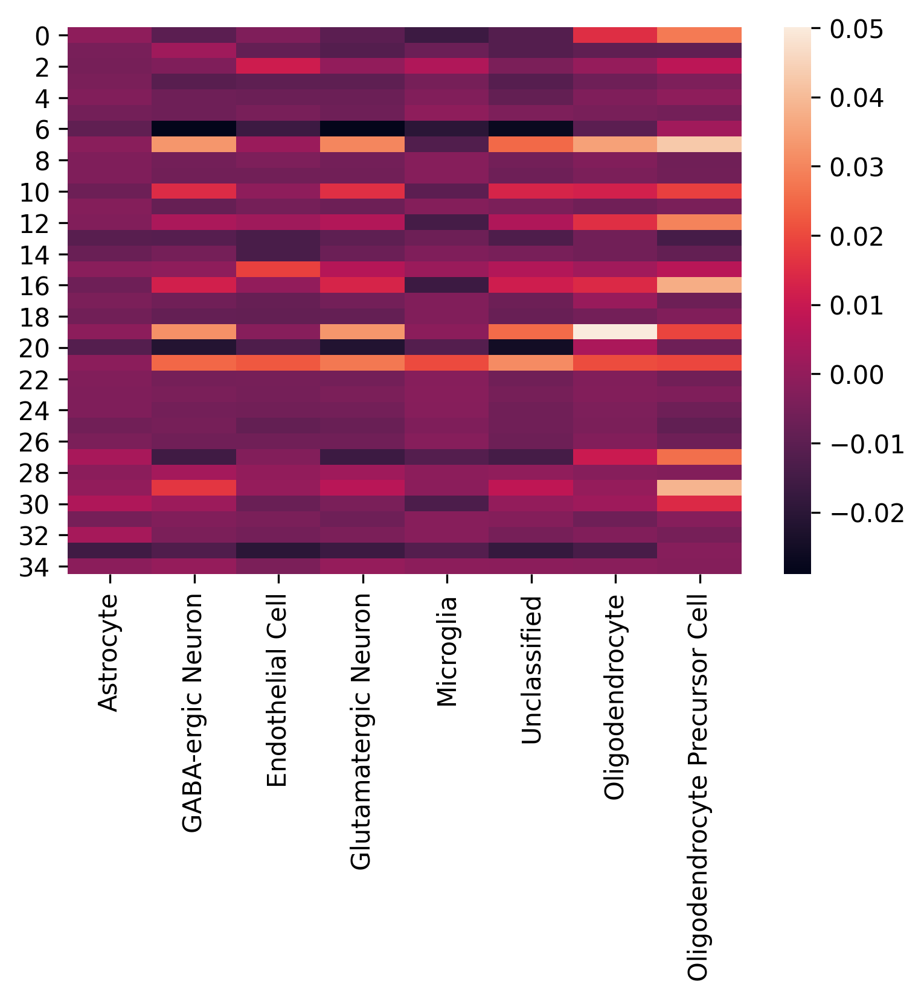

In [24]:
sns.heatmap(correlation_dataframe)